# clustering & Marker gene detection

In [1]:
here::i_am("rna_atac/dimensionality_reduction/WNN_MOFA.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(ArchR))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
      

In [2]:
args = list()
# MOFAsprintf('%s/results/rna_atac/combined_metadata.txt.gz',io$basedir)
args$metadata = file.path(io$basedir, 'results/rna_atac/combined_metadata.txt.gz')
args$MOFA = file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_factors.txt.gz')
args$MOFA_umap = file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_umap.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')

# Archr
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')

# Mapping Luke
args$integrated_object = '/rds/project/rds-SDzz0CATGms/users/ltgh2/projects/01_Eomes_invitro_HE_multiome/processed/rna/seurat_objects/all_anchors_20_rPCA.rds'

# outdir
args$outdir_clusters = file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/')
dir.create(args$outdir_clusters, recursive=TRUE, showWarnings =FALSE)

args$outdir_markers = file.path(io$basedir, 'results/rna_atac/markers/')
dir.create(args$outdir_markers, recursive=TRUE, showWarnings =FALSE)

#### Load data

In [26]:
# Load meta
meta = fread(args$metadata)

# Load mofa 
mofa = fread(args$MOFA)
umap = fread(args$MOFA_umap)

# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = TRUE, cells = meta$cell)

In [27]:
mofa2 = merge(mofa, meta[,c('cell', 'exp')])

In [84]:
plots = lapply(1:25, function(x){
    p = ggplot(mofa2, aes_string('exp', paste0('Factor', x))) + 
            geom_violin() + 
            geom_boxplot(width=0.2, outlier.shape=NA) +
            theme_bw()
})

$`1`

$`2`

attr(,"class")
[1] "list"      "ggarrange"

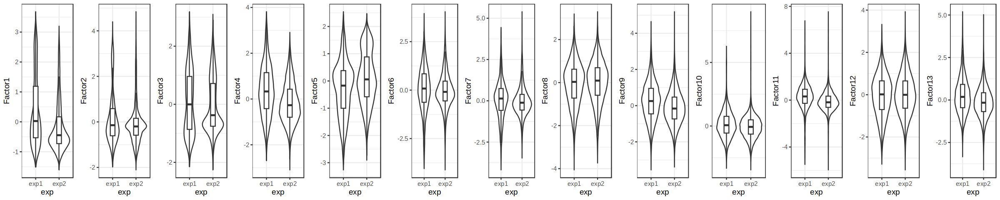

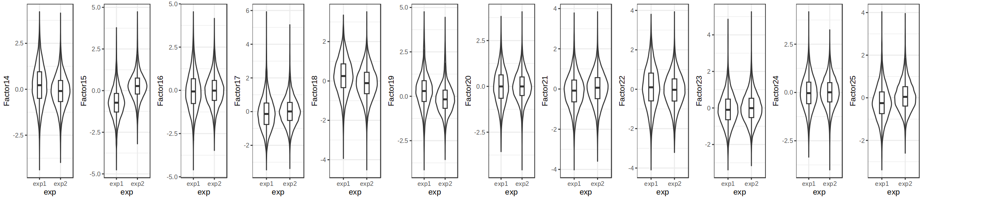

In [86]:
options(repr.plot.width=20, repr.plot.height=4)
ggarrange(plotlist=plots, ncol=13)

In [28]:
colData(rna.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()

In [29]:
mofa.mtx = mofa[match(meta$cell, cell)] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()

umap.mtx = umap[match(meta$cell, cell)] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()

In [95]:
seurat = as.Seurat(rna.sce)
seurat[["mofa"]] <- CreateDimReducObject(embeddings = mofa.mtx, key = "mofa_", assay = DefaultAssay(seurat))
seurat[["umap"]] <- CreateDimReducObject(embeddings = umap.mtx, key = "umap_", assay = DefaultAssay(seurat))

In [96]:
seurat <- FindNeighbors(seurat, reduction='mofa')
seurat <- FindClusters(seurat, resolution = 1.2)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 33177
Number of edges: 969614

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8248
Number of communities: 22
Elapsed time: 4 seconds


Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


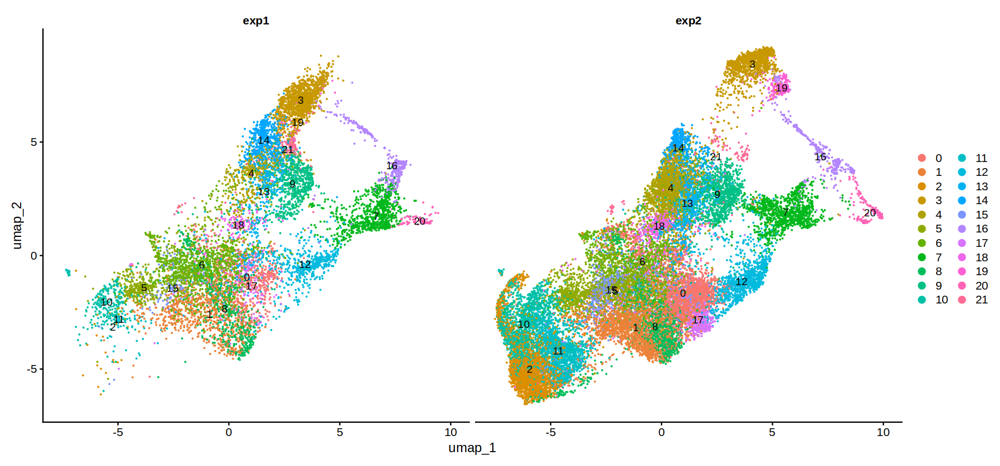

In [97]:
options(repr.plot.width=15, repr.plot.height=7)
DimPlot(seurat, reduction = "umap",  label = TRUE, split.by = 'exp')

In [100]:
saveRDS(seurat, sprintf('%s/seurat_object.rds', args$outdir_clusters))

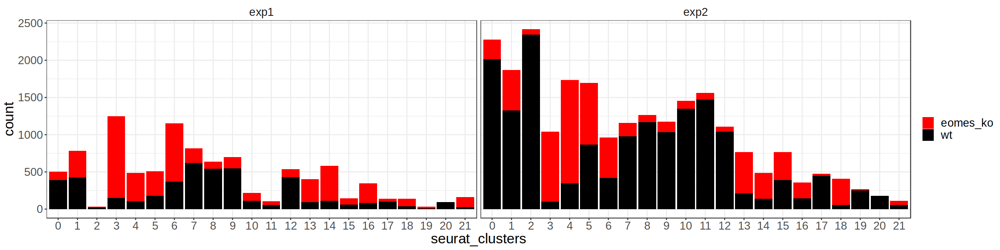

In [98]:
options(repr.plot.width=20, repr.plot.height=5)
ggplot(seurat@meta.data, aes(seurat_clusters, fill=genotype)) + 
    geom_bar() + 
    scale_fill_manual(values=c('wt' = 'black', 'eomes_ko' = 'red'), name='') + 
    facet_wrap(~exp) +
    theme_bw() +
    theme(strip.background = element_blank(),
         text=element_text(size=20, color='black'))

In [138]:
Freq = as.data.table(table(seurat@meta.data$seurat_clusters, seurat@meta.data$exp, seurat@meta.data$genotype)) %>% setnames(c('Cluster','Experiment', 'genotype', 'Freq'))
fwrite(Freq, sprintf('%s/clusters_freq.csv', args$outdir_clusters))

In [141]:
meta_noD3 = as.data.table(seurat@meta.data)[day!='D3']
Freq = as.data.table(table(meta_noD3$seurat_clusters, meta_noD3$exp, meta_noD3$genotype)) %>% setnames(c('Cluster','Experiment', 'genotype', 'Freq'))
fwrite(Freq, sprintf('%s/clusters_freq_noD3.csv', args$outdir_clusters))

In [143]:
Freq = as.data.table(table(meta_noD3$seurat_clusters, meta_noD3$genotype)) %>% setnames(c('Cluster', 'genotype', 'Freq'))


In [147]:
Freq = dcast(Freq, Cluster ~ genotype, value.var = c("Freq")) %>% 
    .[,FC := round(eomes_ko/wt, 2)]

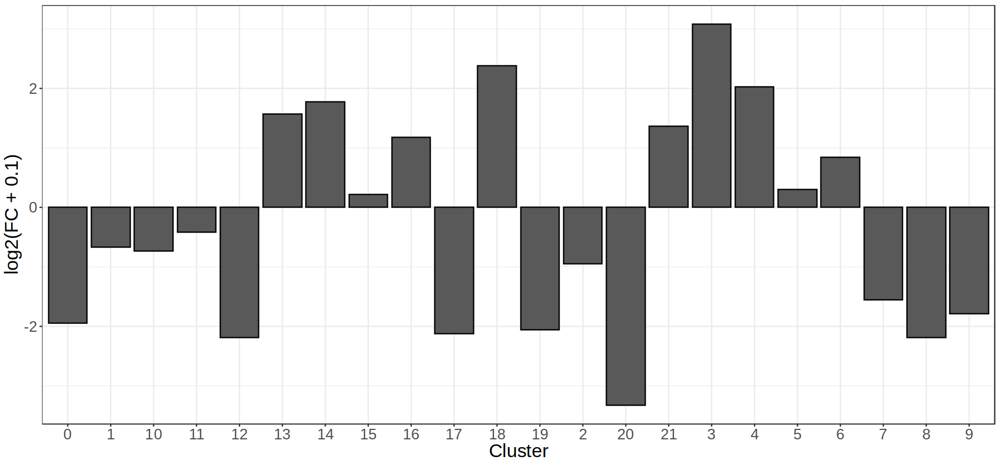

In [157]:
ggplot(Freq, aes(Cluster, log2(FC+1e-1))) + 
    geom_bar(stat='identity', col='black') + 
    theme_bw() +
    theme(strip.background = element_blank(),
         text=element_text(size=20, color='black'))

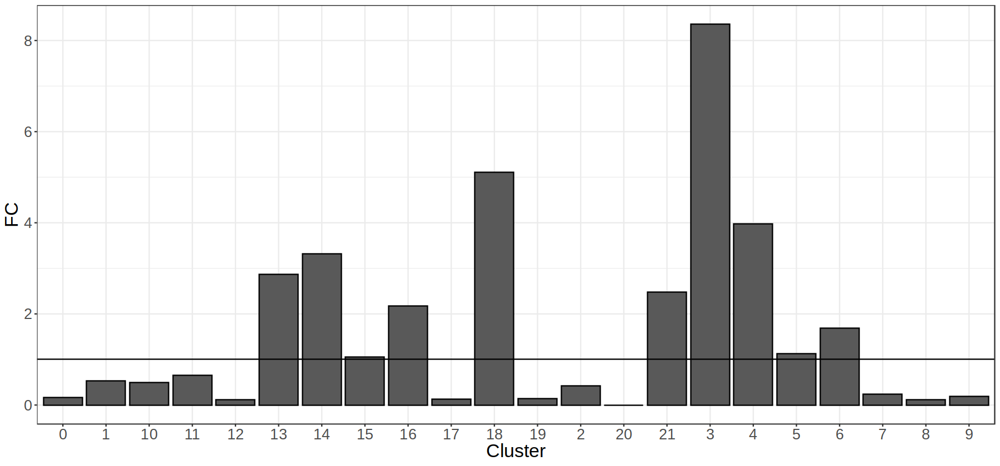

In [158]:
ggplot(Freq, aes(Cluster, FC)) + 
    geom_bar(stat='identity', col='black') + 
    theme_bw() +
    geom_hline(yintercept=1) + 
    theme(strip.background = element_blank(),
         text=element_text(size=20, color='black'))

In [99]:
# Marker detection
markers <- FindAllMarkers(seurat, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21



In [101]:
library(dplyr)
markers_top = markers %>%
    group_by(cluster) %>%
    slice_max(n = 15, order_by = avg_log2FC)

fwrite(markers_top, sprintf('%s/markers_top_seurat.txt.gz', args$outdir_markers))
fwrite(markers_top, sprintf('%s/markers_top_seurat.csv', args$outdir_markers))
fwrite(markers, sprintf('%s/markers_seurat.txt.gz', args$outdir_markers))

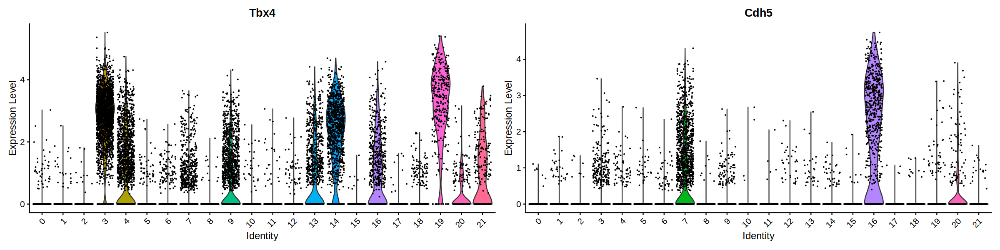

In [104]:
VlnPlot(seurat, features = c("Tbx4", "Cdh5"))

In [ ]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 1, order_by = avg_log2FC) %>% .$gene

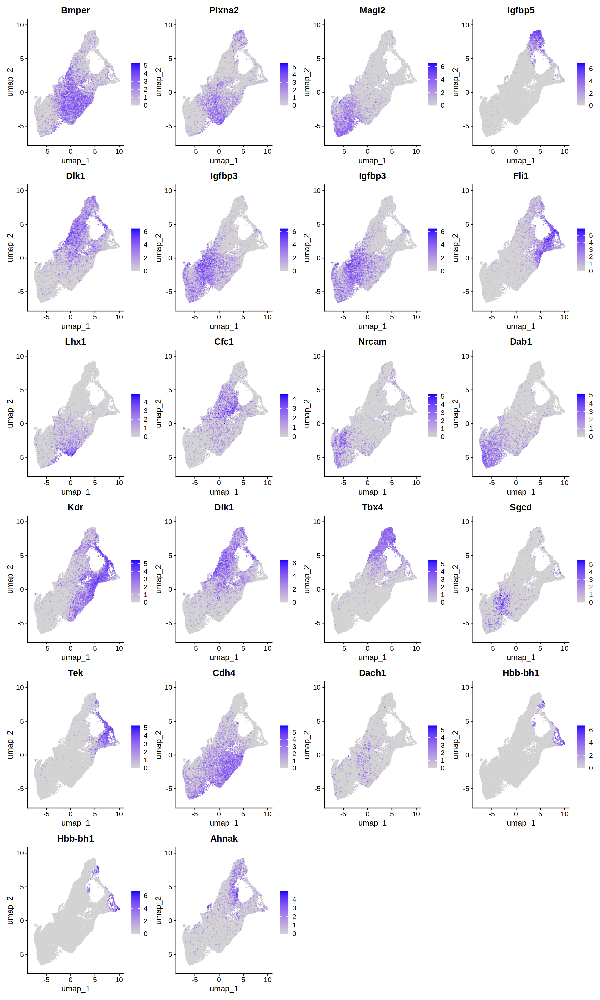

In [108]:

options(repr.plot.width=15, repr.plot.height=25)

FeaturePlot(seurat, features = features)

In [77]:
integrated_seurat = readRDS(args$integrated_object)

In [82]:
meta_int = as.data.table(integrated_seurat@meta.data, keep.rownames=T) %>% setnames('rn', 'cell')
meta_int_eomes = meta_int[match(meta$cell, cell),]

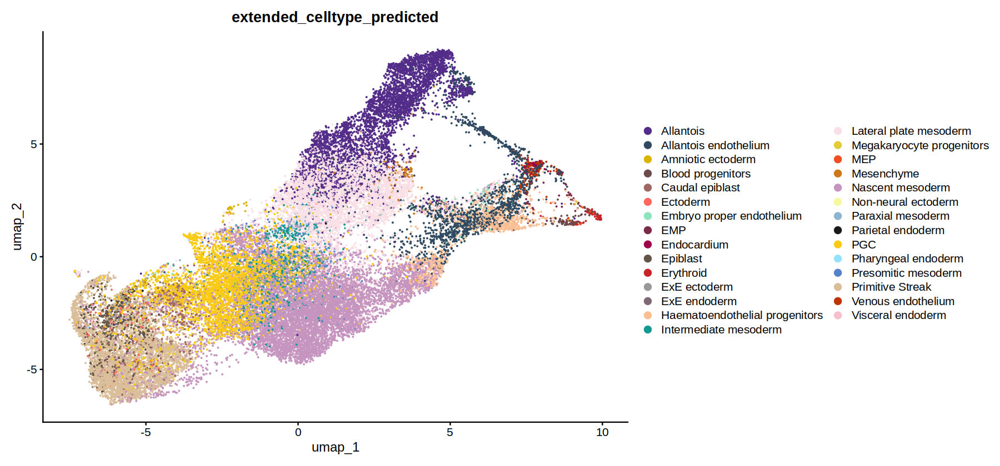

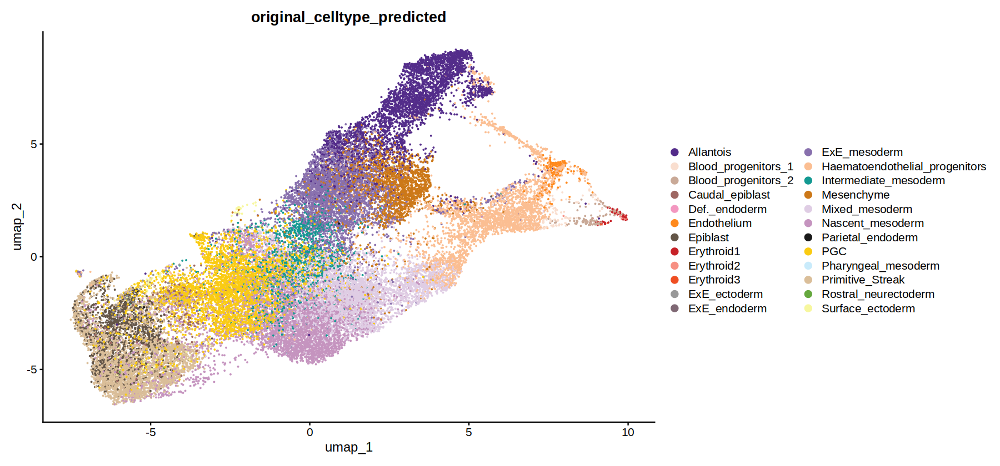

In [133]:
seurat@meta.data$extended_celltype_predicted = meta_int_eomes$extended_celltype_predicted
seurat@meta.data$original_celltype_predicted = gsub(' ', '_', meta_int_eomes$original_celltype_predicted)

options(repr.plot.width=15, repr.plot.height=7)
DimPlot(seurat, reduction = "umap",  label = F, group.by = 'extended_celltype_predicted') + scale_colour_manual(values=opts$celltype_ext.colors)
DimPlot(seurat, reduction = "umap",  label = F, group.by = 'original_celltype_predicted') + scale_colour_manual(values=opts$celltype.colors)

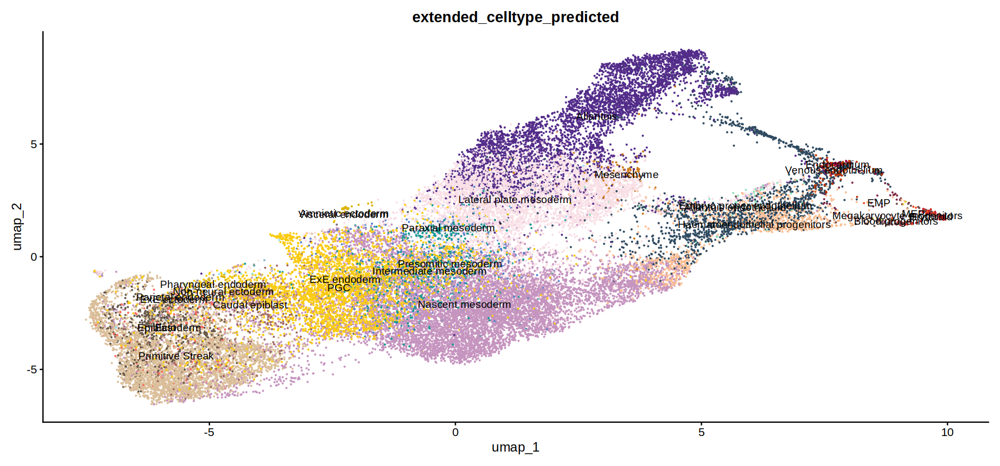

In [139]:
DimPlot(seurat, reduction = "umap",  label = T, group.by = 'extended_celltype_predicted') + scale_colour_manual(values=opts$celltype_ext.colors) + 
    theme(legend.position='none')


### Seurat mapping quite bad so continue with the original mapping for now

In [38]:
args$outdir_clusters

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna_atac/dimensionality_reduction/"

In [3]:
seurat = readRDS(sprintf('%s/seurat_object.rds', args$outdir_clusters))
markers = fread(sprintf('%s/markers_seurat.txt.gz', args$outdir_markers))
umap = fread(args$MOFA_umap)
meta = fread(args$metadata)

In [4]:
summary(umap$cell == colnames(seurat))

   Mode    TRUE 
logical   33177 

In [5]:
palette = c(ArchR::ArchRPalettes$stallion, ArchR::ArchRPalettes$stallion2)
names(palette) = 1:length(palette)

In [37]:
palette

1         2         3         4         5         6         7         8 
"#D51F26" "#272E6A" "#208A42" "#89288F" "#F47D2B" "#FEE500" "#8A9FD1" "#C06CAB" 
        9        10        11        12        13        14        15        16 
"#E6C2DC" "#90D5E4" "#89C75F" "#F37B7D" "#9983BD" "#D24B27" "#3BBCA8" "#6E4B9E" 
       17        18        19        20        21        22        23        24 
"#0C727C" "#7E1416" "#D8A767" "#3D3D3D" "#D51F26" "#272E6A" "#208A42" "#89288F" 
       25        26        27        28        29        30        31        32 
"#F47D2B" "#FEE500" "#8A9FD1" "#C06CAB" "#E6C2DC" "#90D5E4" "#89C75F" "#F37B7D" 
       33        34        35        36        37        38        39 
"#9983BD" "#D24B27" "#3BBCA8" "#6E4B9E" "#0C727C" "#7E1416" "#D8A767"

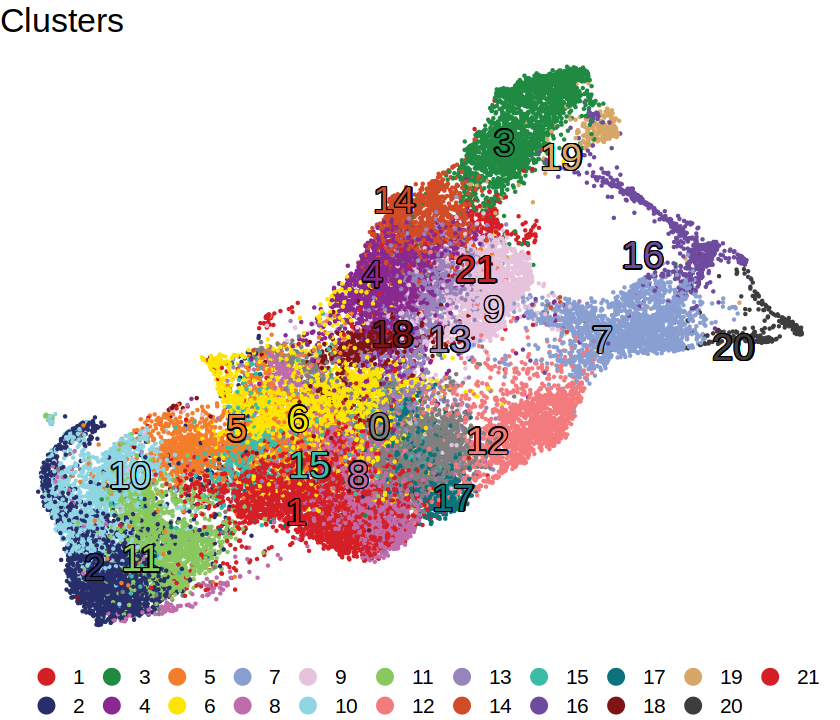

In [74]:
umap.dt = cbind(umap, data.table(clusters = seurat@meta.data$seurat_clusters))
labels = umap.dt[,`:=`(mean_UMAP1 = mean(UMAP1),
                       mean_UMAP2 = mean(UMAP2)), 
                       by=clusters] %>% unique(by='clusters')
p = ggplot(umap.dt, aes(UMAP1, UMAP2, col=clusters, label=clusters)) + 
    geom_point(size=0.2) + 
    ggrepel::geom_text_repel(data=labels, aes(mean_UMAP1, mean_UMAP2), size=8,  bg.color = "black", bg.r=0.05) +
    scale_color_manual(values=palette, name='') +
    guides(colour = guide_legend(override.aes = list(size=4), nrow=2)) + 
    ggtitle('Clusters') +
    theme_void() +
    theme(text=element_text(size=15), 
         plot.title=element_text(size=20), 
         legend.position='bottom',
         legend.box="vertical", legend.margin=margin())

options(repr.plot.width=7, repr.plot.height=6)
p

In [75]:
original_mapping = fread(file.path(io$basedir, '/results/rna/mapping/sample_metadata_after_mapping.txt.gz'))

In [76]:
umap.dt = cbind(umap.dt, original_mapping[match(umap$cell ,cell), celltype]) %>% setnames('V2', 'original_celltype')

In [83]:
umap.dt = cbind(umap.dt, original_mapping[match(umap$cell ,cell), meta_int_eomes$extended_celltype_predicted]) %>% setnames('V2', 'extended_celltype')

In [105]:
p1 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=original_celltype)) + 
    geom_point(size=0.2) + 
    scale_color_manual(values=opts$celltype.colors, name='') +
    guides(colour = guide_legend(override.aes = list(size=4), nrow=10)) + 
    ggtitle('Original Celltype') +
    theme_void() +
    theme(text=element_text(size=15), 
         plot.title=element_text(size=20), 
         legend.position='bottom',
         legend.box="vertical", legend.margin=margin())

p2 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=extended_celltype)) + 
    geom_point(size=0.2) +
    scale_color_manual(values=opts$celltype_ext.colors, name='') +
    guides(colour = guide_legend(override.aes = list(size=4), nrow=10)) + 
    ggtitle('Extended Celltype') +
    theme_void() +
    theme(text=element_text(size=15), 
         plot.title=element_text(size=20), 
         legend.position='bottom',
         legend.box="vertical", legend.margin=margin())

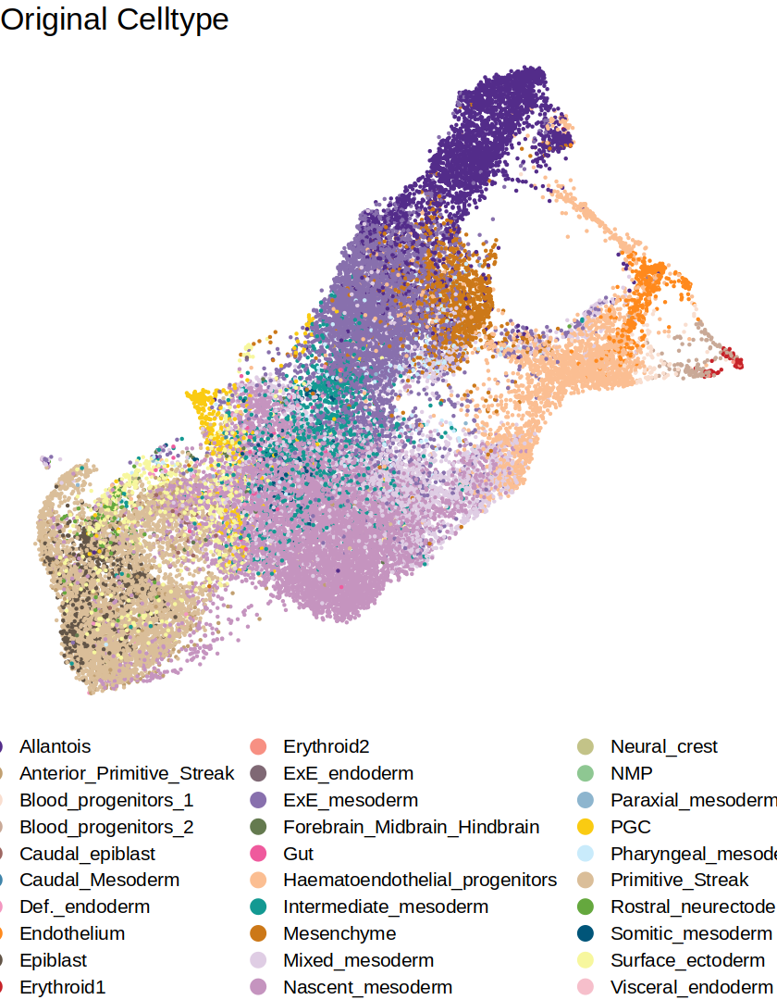

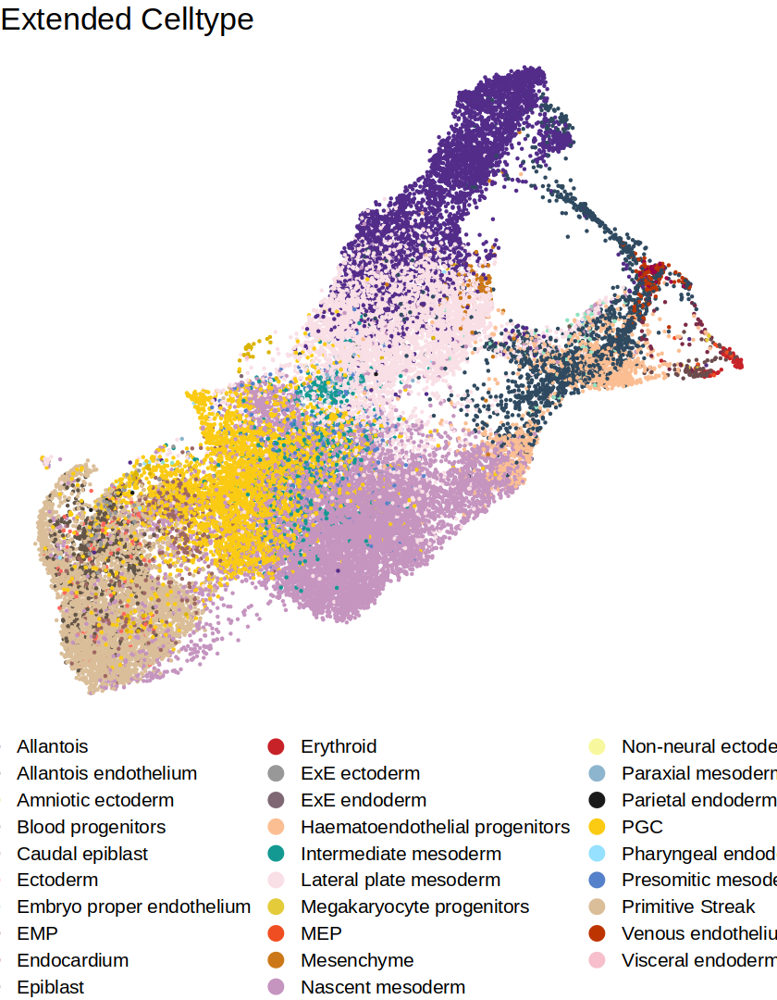

In [106]:
options(repr.plot.width=7, repr.plot.height=9)
p1
p2

In [15]:
cluster_levels = c(0, 12, 17, 1, 8, 18,
                  2, 10, 11,
                  3, 19, 21,
                  4, 13, 14, 9, 
                  5, 6, 15,
                  7, 16,
                  20)

In [16]:
seurat@meta.data$seurat_clusters2 = factor(seurat@meta.data$seurat_clusters, levels = cluster_levels)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


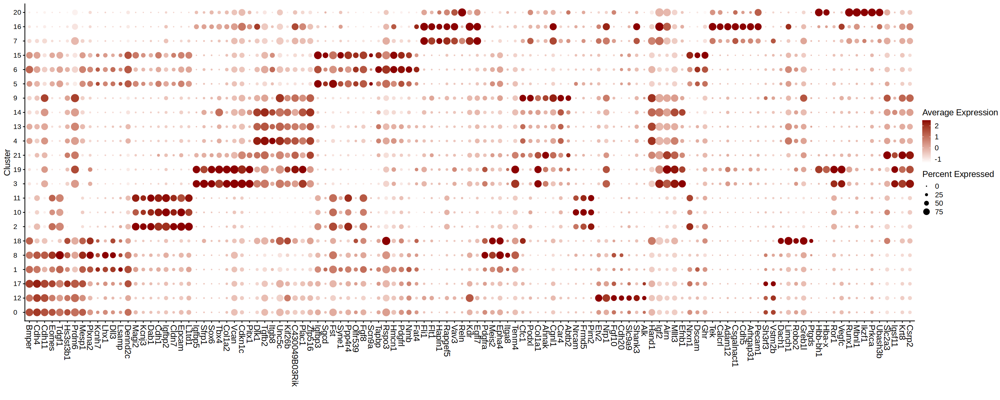

In [95]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 8, order_by = avg_log2FC) %>% .$gene

options(repr.plot.width=25, repr.plot.height=10)
DotPlot(seurat, features = unique(features), group.by = 'seurat_clusters2') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


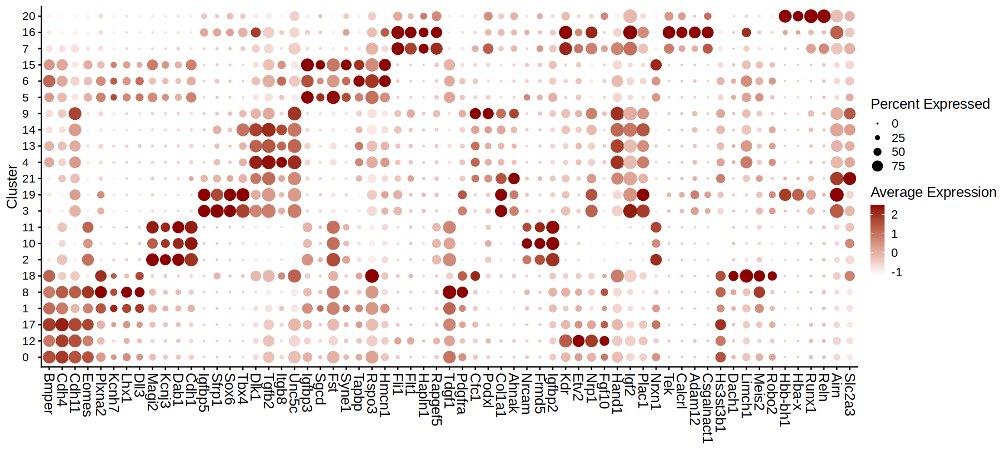

In [98]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 4, order_by = avg_log2FC) %>% .$gene

options(repr.plot.width=15, repr.plot.height=7)
DotPlot(seurat, features = unique(features), group.by = 'seurat_clusters2') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


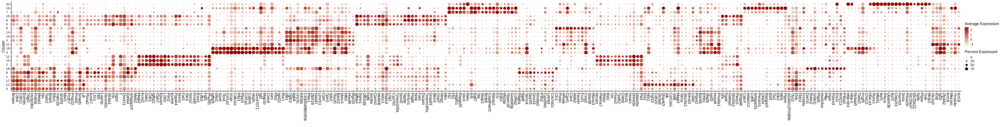

In [21]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 20, order_by = avg_log2FC) %>% .$gene

options(repr.plot.width=55, repr.plot.height=7)
DotPlot(seurat, features = unique(features), group.by = 'seurat_clusters2') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('Cluster') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0))

### Motif markers

In [22]:
cluster_levels = c(0, 12, 17, 1, 8, 18,
                  2, 10, 11,
                  3, 19, 21,
                  4, 13, 14, 9, 
                  5, 6, 15,
                  7, 16,
                  20)

In [226]:
plot_enr_heatmap = function(enrichMotifs, ntop=25) {
    heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

    enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
        .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]

    keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels=cluster_levels)] %>% .[order(variable)] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   
    enriched.dt = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(variable, levels=cluster_levels)]
    
    p = ggplot(enriched.dt, aes(TF, variable, fill=value)) + 
    geom_tile(col='black') +
    scale_fill_gradient(low='white', high='darkblue', name='Norm. Enrichment -log10(P-adj) [0-max]') +
    theme_void() + theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=0),
                        legend.position='bottom')
p
    return(p)
}

In [24]:
meta = as.data.table(seurat@meta.data, keep.rownames=T) %>% setnames('rn', 'cell')

In [25]:
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')
ArchRProject <- loadArchRProject(args$archr_directory)[meta$cell]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [26]:
addArchRThreads(16)

Setting default number of Parallel threads to 16.



In [27]:
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.numeric(meta$seurat_clusters),
                                    cells = meta$cell,
                                    name = "seurat_clusters",
                                    force=TRUE)

In [28]:
out <- getMarkerFeatures( # suppressMessages(
          ArchRProj = ArchRProject, #.filt, 
          useMatrix = "PeakMatrix",
          groupBy = "seurat_clusters",
          testMethod = "wilcoxon", #"binomial",
          binarize=FALSE, # TRUE
          bias = c("TSSEnrichment", "log10(nFrags)"),
          verbose=TRUE
        )

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-1207401a9c2efa-Date-2023-02-23_Time-11-49-05.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2023-02-23 11:49:26 : Matching Known Biases, 0.262 mins elapsed.

###########
2023-02-23 11:54:14 : Completed Pairwise Tests, 5.065 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-1207401a9c2efa-Date-2023-02-23_Time-11-49-05.log



ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-12074015248481-Date-2023-02-23_Time-12-19-08.log
If there is an issue, please report to github with logFile!



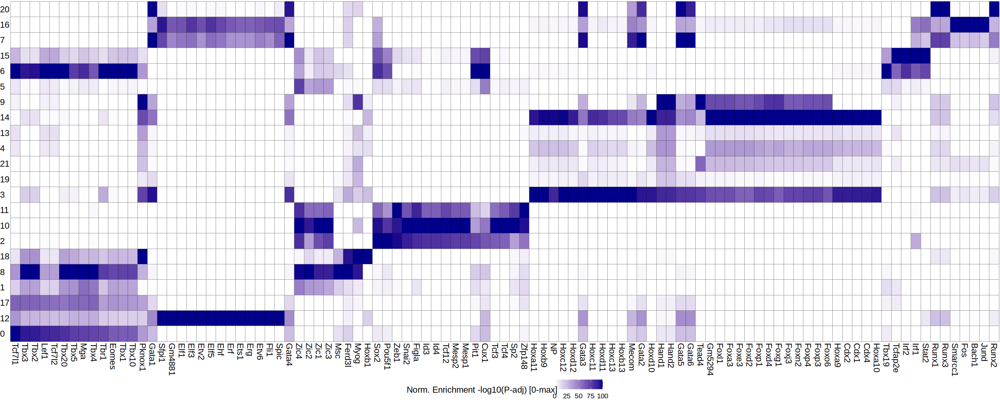

In [33]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = out,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))
colnames(enrichMotifs) = 0:21

options(repr.plot.width=25, repr.plot.height=10)
plot_enr_heatmap(enrichMotifs, ntop = 15)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-120740eee69f4-Date-2023-02-23_Time-12-19-13.log
If there is an issue, please report to github with logFile!



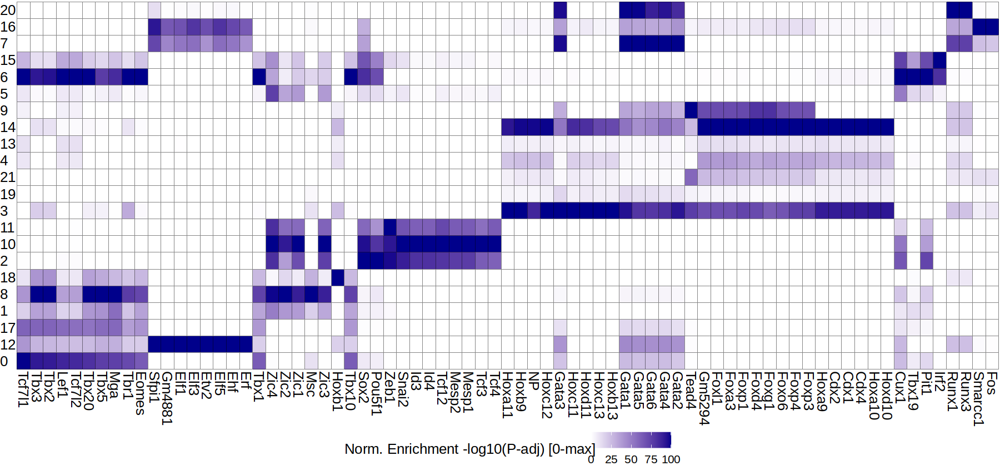

In [34]:
options(repr.plot.width=15, repr.plot.height=7)
plot_enr_heatmap(enrichMotifs, ntop = 10)

In [31]:
ArchRProject@peakAnnotation

List of length 2
names(2): Motif_cisbp Motif_JASPAR2020

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-120740171c98de-Date-2023-02-23_Time-12-15-40.log
If there is an issue, please report to github with logFile!

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-1207405cd671b7-Date-2023-02-23_Time-12-16-05.log
If there is an issue, please report to github with logFile!



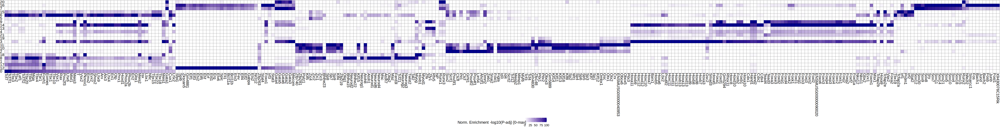

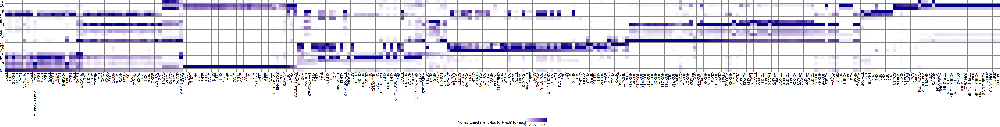

In [32]:
# For Luke
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = out,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))
colnames(enrichMotifs) = 0:21

options(repr.plot.width=55, repr.plot.height=7)
plot_enr_heatmap(enrichMotifs, ntop = 50)

enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = out,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))
colnames(enrichMotifs) = 0:21

options(repr.plot.width=55, repr.plot.height=7)
plot_enr_heatmap(enrichMotifs, ntop = 50)

In [35]:
out <- getMarkerFeatures( # suppressMessages(
          ArchRProj = ArchRProject, #.filt, 
          useMatrix = "PeakMatrix",
          groupBy = "seurat_clusters",
          testMethod = "binomial", #"binomial",
          binarize=TRUE, # TRUE
          bias = c("TSSEnrichment", "log10(nFrags)"),
          verbose=TRUE
        )

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-1207404c4927cc-Date-2023-02-23_Time-12-50-02.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2023-02-23 12:50:10 : Matching Known Biases, 0.011 mins elapsed.

###########
2023-02-23 12:54:40 : Completed Pairwise Tests, 4.511 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-1207404c4927cc-Date-2023-02-23_Time-12-50-02.log



ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-12074058651214-Date-2023-02-23_Time-12-55-03.log
If there is an issue, please report to github with logFile!



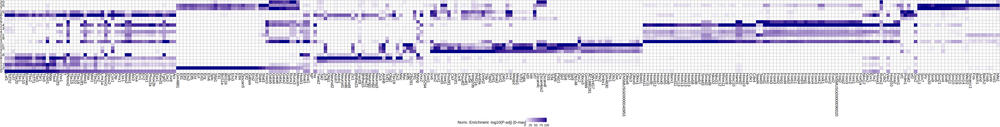

In [36]:
# For Luke
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = out,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_cisbp",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))
colnames(enrichMotifs) = 0:21

options(repr.plot.width=55, repr.plot.height=7)
plot_enr_heatmap(enrichMotifs, ntop = 50)

# Labelling clusters


In [3]:
seurat = readRDS(sprintf('%s/seurat_object.rds', args$outdir_clusters))
markers = fread(sprintf('%s/markers_seurat.txt.gz', args$outdir_markers))
umap = fread(args$MOFA_umap)
meta = fread(args$metadata)

In [4]:
clusters2celltypes = c(
'10' = 'Primitive_Streak', 
'11' = 'Primitive_Streak', 
'2' = 'Primitive_Streak',   
'0' = 'Mesoderm_KDR+_PDGFRA+',
'1' = 'Mesoderm_KDR+_PDGFRA+',
'8' = 'Mesoderm_KDR+_PDGFRA+',
'17' = 'Mesoderm_KDR+_PDGFRA+',
'5' = 'Mesoderm_KDR-_T+',
'6' = 'Mesoderm_KDR-_T+',
'15' = 'Mesoderm_KDR-_T+',
'18' = 'Mesoderm_Meis2+',    #_Hand1+_Greb1l+, but sort of mutually exclusive?
'4' = 'Posterior_Mesoderm_Cdx4+_Hoxa9+',
'13' = 'Posterior_Mesoderm_Cdx4+_Hoxa9+',
'21' = 'Posterior_Mesoderm_Cdx4+_Hoxa9+',
'9' = 'Mesenchyme_Podxl+_Foxf1+',
'14' = 'Allantois_Precursor_Tbx4+_Pitx1-',
'19' = 'Allantois',
'3' = 'Allantois',
'12' = 'HE_precursor',
'7' = 'HE',
'16' = 'Endothelium', 
'20' = 'blood')

In [5]:
clusters2celltypes = c(
'10' = 'Primitive_Streak', 
'11' = 'Primitive_Streak', 
'2' = 'Primitive_Streak',   
'0' = 'Mesoderm_Eomes+_PdgfRa+',
'1' = 'Mesoderm_Eomes+_PdgfRa+',
'8' = 'Mesoderm_Eomes+_PdgfRa+',
'17' = 'Mesoderm_Eomes+_PdgfRa+',
'5' = 'Mesoderm_Eomes-_T+',
'6' = 'Mesoderm_Eomes-_T+',
'15' = 'Mesoderm_Eomes-_T+',
'18' = 'Mesoderm_Meis2+',    #_Hand1+_Greb1l+, but sort of mutually exclusive?
'4' = 'Posterior_Mesoderm_Cdx4+_Hoxa9+',
'13' = 'Posterior_Mesoderm_Cdx4+_Hoxa9+',
'21' = 'Posterior_Mesoderm_Cdx4+_Hoxa9+',
'9' = 'Mesenchyme_Podxl+_Foxf1+',
'14' = 'Allantois_Precursor_Tbx4+_Pitx1-',
'19' = 'Allantois',
'3' = 'Allantois',
'12' = 'HE_precursor',
'7' = 'HE',
'16' = 'Endothelium', 
'20' = 'blood')

In [6]:
names(clusters2celltypes)[order(names(clusters2celltypes))]

[1] "0"  "1"  "10" "11" "12" "13" "14" "15" "16" "17" "18" "19" "2"  "20" "21"
[16] "3"  "4"  "5"  "6"  "7"  "8"  "9"

In [7]:
seurat@meta.data$celltypes_v1 = clusters2celltypes[match(as.character(seurat@meta.data$seurat_clusters), names(clusters2celltypes))]

In [8]:
palette = c(ArchR::ArchRPalettes$stallion, ArchR::ArchRPalettes$stallion2)[1:length(unique(clusters2celltypes))]
names(palette) = unique(clusters2celltypes)

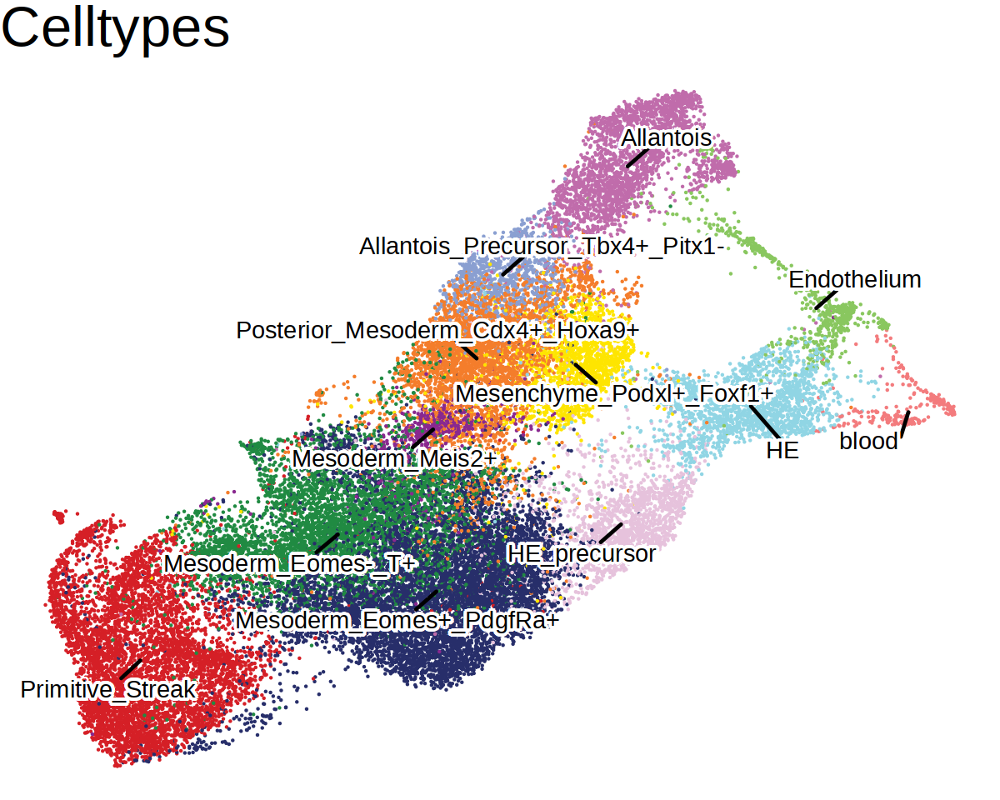

In [299]:
umap.dt = cbind(umap, data.table(celltypes_v1 = seurat@meta.data$celltypes_v1))
labels = umap.dt[,`:=`(mean_UMAP1 = median(UMAP1),
                       mean_UMAP2 = median(UMAP2)), 
                       by=celltypes_v1] %>% unique(by='celltypes_v1')
p = ggplot(umap.dt, aes(UMAP1, UMAP2, col=celltypes_v1, label=celltypes_v1)) + 
    geom_point(size=0.2) + 
    ggrepel::geom_text_repel(data=labels, aes(mean_UMAP1, mean_UMAP2), 
                             col='black', 
                             size=6,  
                             bg.color = "white", 
                             bg.r=0.2,
                             box.padding=1,
                             max.overlaps=Inf,
                             #   segment.curvature = -1,
                            segment.size = 1) +
    scale_color_manual(values=palette, name='') +
    guides(colour = guide_legend(override.aes = list(size=4))) + 
    ggtitle('Celltypes') +
    theme_void() +
     theme(text=element_text(size=15), 
          plot.title=element_text(size=40), 
          legend.position='none')#,
    #      legend.box="vertical", legend.margin=margin())

options(repr.plot.width=10, repr.plot.height=8)
p 

In [300]:
pdf(file.path(args$outdir_clusters, 'celltypes_v1.pdf'), width=10, height=10)
    p
dev.off()

png 
  2

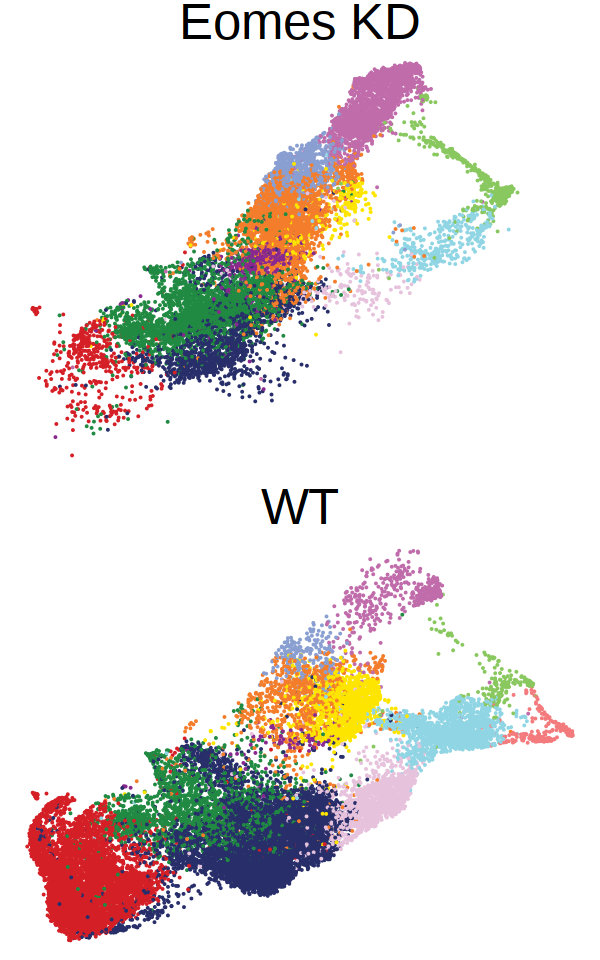

In [27]:
# Get metadata
umap.dt = cbind(umap, data.table(celltypes_v1 = seurat@meta.data$celltypes_v1))
umap.dt = cbind(umap.dt, data.table(genotype = ifelse(seurat@meta.data$genotype == 'eomes_ko', 'Eomes KD', 'WT')))

# Get celltype mean location
labels = umap.dt[,`:=`(mean_UMAP1 = median(UMAP1),
                       mean_UMAP2 = median(UMAP2)), 
                       by=celltypes_v1] %>% unique(by='celltypes_v1')

# plot
p = ggplot(umap.dt, aes(UMAP1, UMAP2, col=celltypes_v1, label=celltypes_v1)) + 
    geom_point(size=0.05) + 
    # ggrepel::geom_text_repel(data=labels, aes(mean_UMAP1, mean_UMAP2), 
    #                          col='black', 
    #                          size=6,  
    #                          bg.color = "white", 
    #                          bg.r=0.2,
    #                          box.padding=1,
    #                          max.overlaps=Inf,
                             #  segment.curvature = -1,
                               # segment.size = 1) +
    scale_color_manual(values=palette, name='') +
    guides(colour = guide_legend(override.aes = list(size=4))) + 
    facet_wrap(~genotype, ncol=1) + 
    theme_void() +
     theme(text=element_text(size=15), 
          plot.title=element_text(size=40), 
           strip.text=element_text(size=30),
          legend.position='none')#,
    #      legend.box="vertical", legend.margin=margin())

options(repr.plot.width=5, repr.plot.height=8)
p 

#### RNA analysis

In [213]:
Idents(seurat) = seurat@meta.data$celltypes_v1

In [214]:
# Marker detection
markers <- FindAllMarkers(seurat, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)

Calculating cluster Primitive_Streak

Calculating cluster Mesoderm_Eomes+_PdgfRa+

Calculating cluster Mesoderm_Eomes-_T+

Calculating cluster Mesoderm_Meis2+

Calculating cluster Posterior_Mesoderm_Cdx4+_Hoxa9+

Calculating cluster HE_precursor

Calculating cluster HE

Calculating cluster Mesenchyme_Podxl+_Foxf1+

Calculating cluster Allantois_Precursor_Tbx4+_Pitx1-

Calculating cluster Endothelium

Calculating cluster blood

Calculating cluster Allantois



In [215]:
library(dplyr)
markers_top = markers %>%
    group_by(cluster) %>%
    slice_max(n = 15, order_by = avg_log2FC)

fwrite(markers_top, sprintf('%s/markers_top_celltypev1_seurat.txt.gz', args$outdir_markers))
fwrite(markers_top, sprintf('%s/markers_top_celltypev1_seurat.csv', args$outdir_markers))
fwrite(markers, sprintf('%s/markers_seurat_celltypev1.txt.gz', args$outdir_markers))

In [216]:
seurat@meta.data$celltypes_v1 = factor(seurat@meta.data$celltypes_v1, levels = unique(clusters2celltypes))
markers$cluster = factor(markers$cluster, levels = unique(clusters2celltypes))

In [217]:
features = markers %>%
    group_by(cluster) %>%
    slice_max(n = 3, order_by = avg_log2FC) %>% .$gene
features

[1] "Dab1"    "Igfbp2"  "Cdh1"    "Tdgf1"   "Bmper"   "Lhx1"    "Igfbp3" 
 [8] "Sgcd"    "Olfr539" "Dach1"   "Limch1"  "Meis2"   "Dlk1"    "Tgfb2"  
[15] "Unc5c"   "Cfc1"    "Podxl"   "Col1a1"  "Tbx4"    "Igf2"    "Dlk1"   
[22] "Igfbp5"  "Sfrp1"   "Sox6"    "Kdr"     "Etv2"    "Nrp1"    "Fli1"   
[29] "Flt1"    "Hapln1"  "Tek"     "Calcrl"  "Adam12"  "Hbb-bh1" "Runx1"  
[36] "Reln"

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


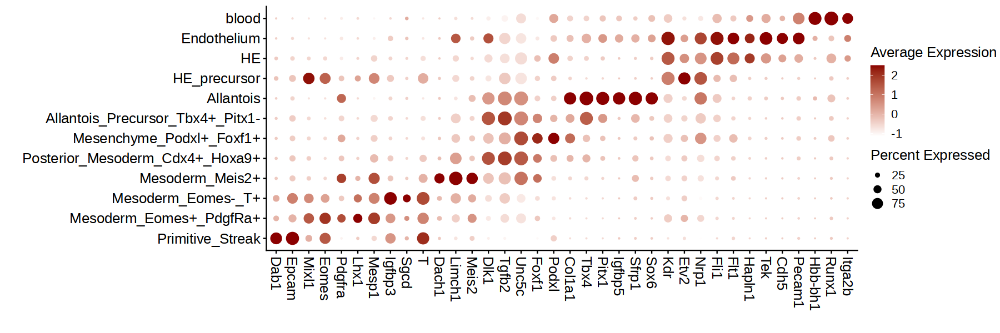

In [301]:
# modified markers a bit to point out specific things
features = c('Dab1', 'Epcam',  'Mixl1',   'Eomes',   
    'Pdgfra',    'Lhx1', 'Mesp1',
    'Igfbp3',    'Sgcd',    'T',
    'Dach1',    'Limch1',    'Meis2',
    'Dlk1',    'Tgfb2',    'Unc5c',
    'Foxf1',    'Podxl',    'Col1a1', 
    'Tbx4',    'Pitx1',    'Dlk1',
    'Igfbp5',    'Sfrp1',    'Sox6',
    'Kdr',    'Etv2',    'Nrp1',
    'Fli1',    'Flt1',    'Hapln1',
    'Tek',    'Cdh5',    'Pecam1',
    'Hbb-bh1',    'Runx1',    'Itga2b'
)

options(repr.plot.width=15, repr.plot.height=5)
p = DotPlot(seurat, features = unique(features), group.by = 'celltypes_v1') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=1, size=15))
p

In [306]:
pdf(file.path(args$outdir_markers, 'expression_heatmap.pdf'), width=15, height=5)
    p
dev.off()

png 
  2

In [1]:
library(data.table)
library(ggplot2)

In [2]:
getwd()

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code/rna_atac/dimensionality_reduction"

In [13]:
args = list()
args$outdir_markers = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna_atac/markers/'
test = fread(sprintf('%s/markers_seurat_celltypev1.txt.gz', args$outdir_markers))%>%
    group_by(cluster) %>%
    slice_max(n = 15, order_by = avg_log2FC)

In [14]:
head(test)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
0,1.200915,0.815,0.212,0,Primitive_Streak,Dab1
0,1.152446,0.942,0.400,0,Primitive_Streak,Igfbp2
0,1.139099,0.918,0.283,0,Primitive_Streak,Cdh1
0,1.108468,0.836,0.301,0,Primitive_Streak,Magi2
0,1.083471,0.666,0.198,0,Primitive_Streak,Kcnj3
0,1.057655,0.706,0.097,0,Primitive_Streak,Pim2


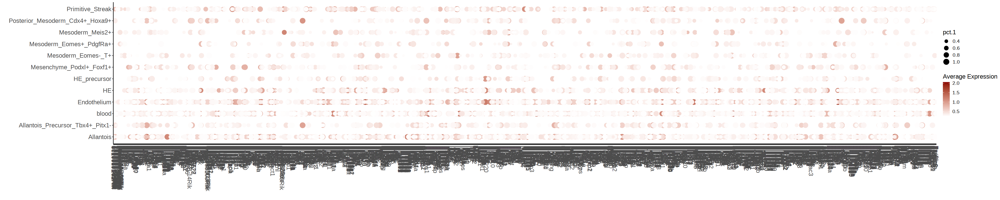

In [15]:
options(repr.plot.width=35)
ggplot(test, aes(gene, cluster, col=avg_log2FC, size = pct.1)) + 
    geom_point() + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    ylab('') + xlab('') +
    theme_classic() + 
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=1, size=15))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


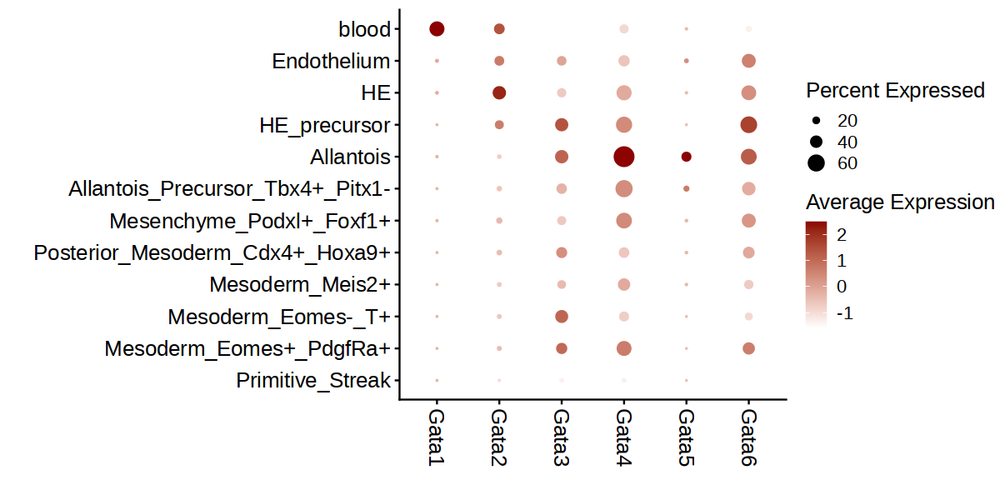

In [243]:
# modified markers a bit to point out specific things
features = paste0('Gata', 1:6)

options(repr.plot.width=10, repr.plot.height=5)
DotPlot(seurat, features = unique(features), group.by = 'celltypes_v1') + 
    scale_color_gradient(low='white', high='darkred', name='Average Expression') + 
    RotatedAxis() +
    ylab('') + xlab('') +
    theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=1, size=15))

#### ATAC analysis

In [219]:
meta = as.data.table(seurat@meta.data, keep.rownames=T) %>% setnames('rn', 'cell')

In [230]:
head(meta)

cell,orig.ident,nCount_RNA,nFeature_RNA,barcode,sample,mitochondrial_percent_RNA,ribosomal_percent_RNA,alias,day,⋯,BlacklistRatio_atac,pass_atacQC,Clusters_TileMatrix0.5,Clusters_TileMatrix_genotype,Clusters_PeakMatrix_genotype,Clusters_PeakMatrix2,exp,RNA_snn_res.1.2,seurat_clusters,celltypes_v1
<chr>,<fct>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,⋯,<dbl>,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<fct>,<fct>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,1A,22923,6110,AAACAGCCAGCAAGAT-1,1A_Eo_DEG_G9_day3,6.09,10.15,day3_wt_rep1,D3,⋯,0.02,TRUE,C2,C2wt,C11wt,C11,exp2,10,10,Primitive_Streak
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,1A,10794,4201,AAACAGCCAGCACCAT-1,1A_Eo_DEG_G9_day3,6.57,7.38,day3_wt_rep1,D3,⋯,0.02,TRUE,C2,C2wt,C11wt,C11,exp2,2,2,Primitive_Streak
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,1A,8745,3659,AAACATGCAAGTAAGC-1,1A_Eo_DEG_G9_day3,5.74,11.92,day3_wt_rep1,D3,⋯,0.02,TRUE,C2,C2wt,C11wt,C11,exp2,2,2,Primitive_Streak
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,1A,8461,3640,AAACATGCAATATACC-1,1A_Eo_DEG_G9_day3,3.70,7.21,day3_wt_rep1,D3,⋯,0.02,TRUE,C2,C2wt,C11wt,C11,exp2,2,2,Primitive_Streak
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,1A,8276,3632,AAACATGCAATCCTGA-1,1A_Eo_DEG_G9_day3,4.60,8.16,day3_wt_rep1,D3,⋯,0.02,TRUE,C2,C2wt,C11wt,C11,exp2,2,2,Primitive_Streak
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,1A,15676,4878,AAACATGCACTTAGGC-1,1A_Eo_DEG_G9_day3,7.34,8.97,day3_wt_rep1,D3,⋯,0.02,TRUE,C2,C2wt,C11wt,C11,exp2,10,10,Primitive_Streak


In [220]:
args$archr_directory = file.path(io$basedir, 'processed/atac/archR')
ArchRProject <- loadArchRProject(args$archr_directory)[meta$cell]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [221]:
addArchRThreads(16)

Setting default number of Parallel threads to 16.



In [232]:
ArchRProject <- addCellColData(ArchRProj = ArchRProject, 
                                    data = as.character(meta$celltypes_v1),
                                    cells = meta$cell,
                                    name = "celltypes_v1",
                                    force=TRUE)

Overriding previous entry for celltypes_v1



In [234]:
out <- getMarkerFeatures( # suppressMessages(
          ArchRProj = ArchRProject, #.filt, 
          useMatrix = "PeakMatrix",
          groupBy = "celltypes_v1",
          testMethod = "wilcoxon", #"binomial",
          binarize=FALSE, # TRUE
          bias = c("TSSEnrichment", "log10(nFrags)"),
          verbose=TRUE
        )

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-6e8051b10cc9-Date-2023-02-24_Time-12-08-39.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2023-02-24 12:08:41 : Matching Known Biases, 0.004 mins elapsed.

###########
2023-02-24 12:10:11 : Completed Pairwise Tests, 1.502 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-getMarkerFeatures-6e8051b10cc9-Date-2023-02-24_Time-12-08-39.log



In [235]:
cluster_levels = unique(clusters2celltypes)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-6e8033dcf776-Date-2023-02-24_Time-12-24-38.log
If there is an issue, please report to github with logFile!



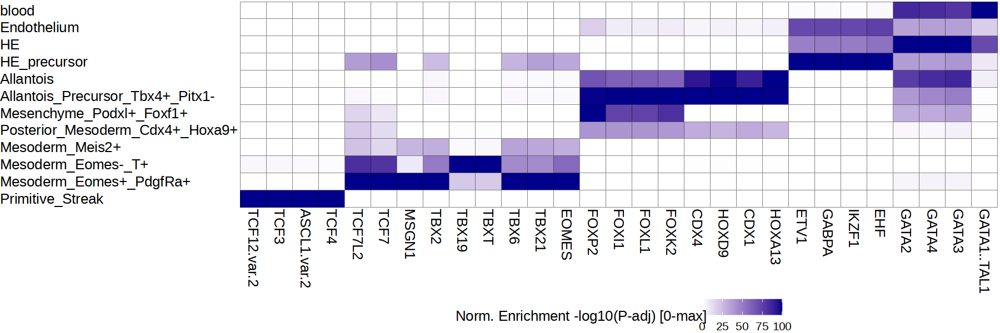

In [254]:
enrichMotifs <- suppressMessages(peakAnnoEnrichment(
    seMarker = out,
    ArchRProj = ArchRProject,
    peakAnnotation = "Motif_JASPAR2020",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  ))

options(repr.plot.width=15, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 4)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-6e804691a8b1-Date-2023-02-24_Time-12-32-10.log
If there is an issue, please report to github with logFile!



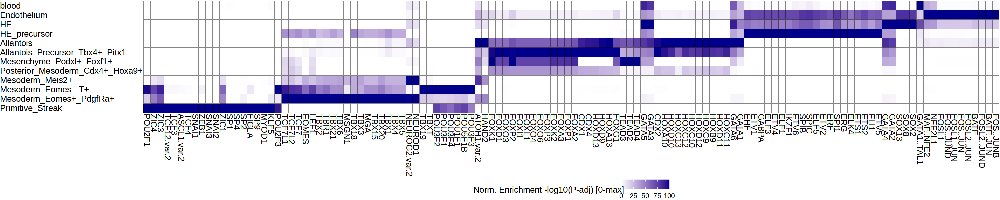

In [266]:
options(repr.plot.width=25, repr.plot.height=5)
plot_enr_heatmap(enrichMotifs, ntop = 20)

In [257]:
# Manually curate list of TFs
ntop = 6
heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
    .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]
keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels=cluster_levels)] %>% .[order(variable)] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   

unique(keep_tfs)

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-6e8045222cba-Date-2023-02-24_Time-12-27-07.log
If there is an issue, please report to github with logFile!



[1] "TCF12.var.2" "TCF3"        "ASCL1.var.2" "TCF4"        "SNAI1"      
 [6] "ZEB1"        "TCF7L2"      "TCF7"        "MSGN1"       "TBX2"       
[11] "EOMES"       "TBX21"       "TBX19"       "TBXT"        "POU3F2"     
[16] "POU3F1"      "NEUROD1"     "TBX6"        "FOXP2"       "FOXI1"      
[21] "FOXL1"       "FOXO4"       "FOXO6"       "FOXK2"       "CDX4"       
[26] "HOXD9"       "CDX2"        "CDX1"        "HOXA13"      "HOXA10"     
[31] "GATA6"       "ETV1"        "GABPA"       "IKZF1"       "EHF"        
[36] "ETV4"        "ELF1"        "GATA2"       "GATA4"       "GATA3"      
[41] "GATA5"       "GATA1..TAL1" "ELF3"

In [276]:
ntop = 40
heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = ntop, returnMatrix = TRUE)

enriched.dt = melt(as.data.table(heatmapEM, keep.rownames=T) %>% setnames('rn', 'TF'), id.vars = c("TF")) %>%
    .[order(-value)] %>% .[,TF:=strsplit(TF, '_') %>% map_chr(1)]
keep_tfs = enriched.dt %>% .[,variable:=factor(variable, levels=cluster_levels)] %>% .[order(variable)] %>% .[, head(.SD, ntop),  by=variable] %>% .$TF   

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-6e80505bddd8-Date-2023-02-24_Time-12-37-36.log
If there is an issue, please report to github with logFile!



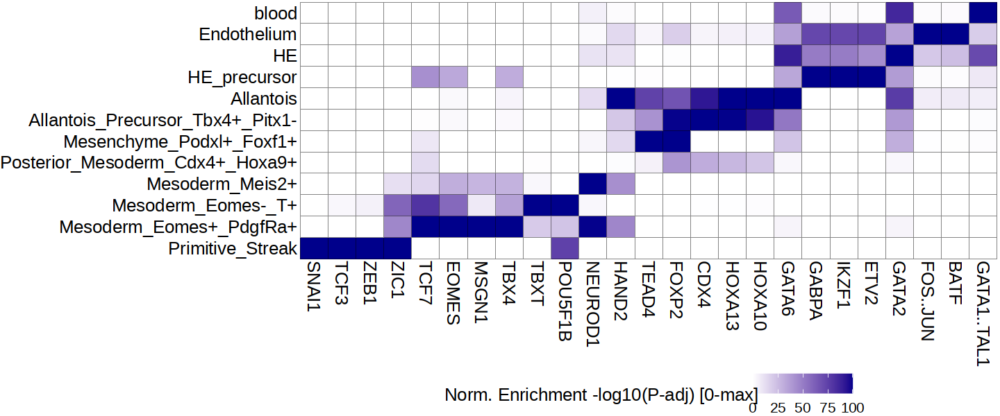

In [307]:
keep_tfs = c(
    'SNAI1', 'TCF3', 'ZEB1', 'ZIC1', 
    'TCF7', 'EOMES', 'MSGN1', 'TBX4',
    'TBXT', 'POU5F1B',
    'NEUROD1', 'HAND2', 
    'TEAD4','FOXP2', 
    'CDX4', 'HOXA13', 'HOXA10',  
    'GATA6', 'GABPA', 'IKZF1', 'ETV2', 
    'GATA2', 
    'FOS..JUN', 'BATF', 
    'GATA1..TAL1'
    )

enriched.dt2 = enriched.dt[TF %in% keep_tfs] %>% .[order( -value)] %>% 
        #.[,TF:=strsplit(TF, '_') %>% map_chr(1)] %>%
         .[,TF:=factor(TF, levels=unique(keep_tfs))] %>%
        .[,variable:=factor(variable, levels=cluster_levels)]
    
    p = ggplot(enriched.dt2, aes(TF, variable, fill=value)) + 
    geom_tile(col='black') +
    scale_fill_gradient(low='white', high='darkblue', name='Norm. Enrichment -log10(P-adj) [0-max]') +
    theme_void() + theme(text=element_text(size=15), 
                         axis.text.x=element_text(angle=-90,hjust=0,vjust=0.5, size=15), 
                         axis.text.y=element_text(hjust=1),
                        legend.position='bottom')
options(repr.plot.width=12, repr.plot.height=5)

p

In [ ]:
pdf(file.path(args$outdir_markers, 'mo_heatmap.pdf'), width=15, height=5)
    p
dev.off()

#### Differential Abundance

In [9]:
meta = as.data.table(seurat@meta.data)[day!='D3']
prop = as.data.table(prop.table(table(meta$genotype, meta$celltypes_v1), 1), keep.rownames=T)

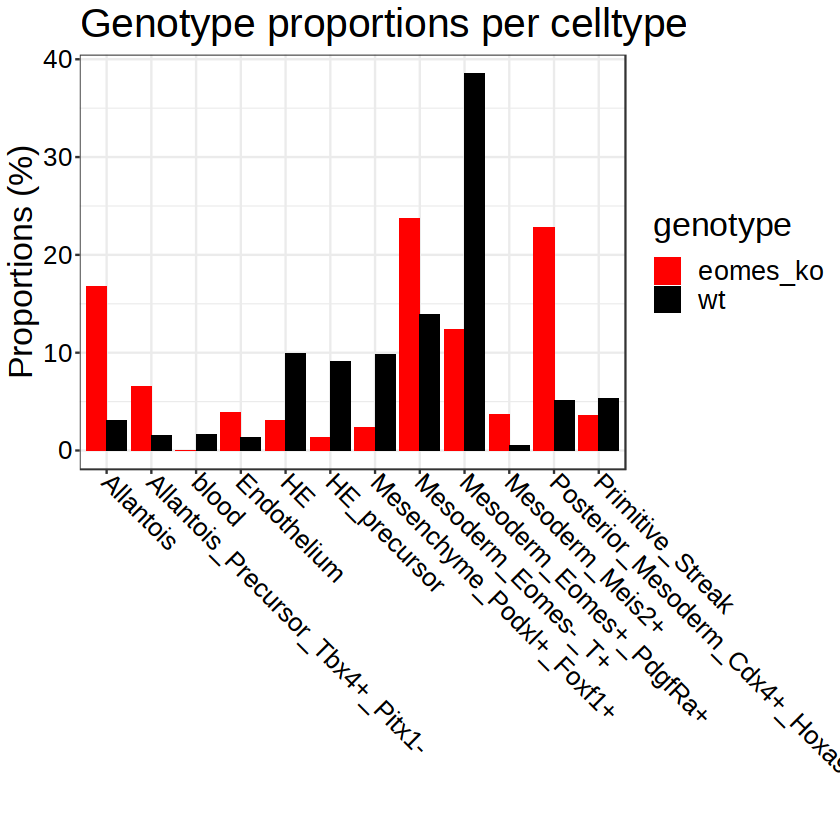

In [10]:
ggplot(prop, aes(V2, N*100, fill=V1)) + 
    geom_bar(stat='identity', position='dodge') +
    scale_fill_manual(values=c('wt' = 'black', 'eomes_ko' = 'red'), name='genotype') + 
    xlab('') + ylab('Proportions (%)') + 
    ggtitle('Genotype proportions per celltype') +
    theme_bw() + 
    theme(text = element_text(size=20),
          axis.text = element_text(color='black', size = 15),
          axis.text.x = element_text(angle=-45, hjust=0, vjust=0.5))

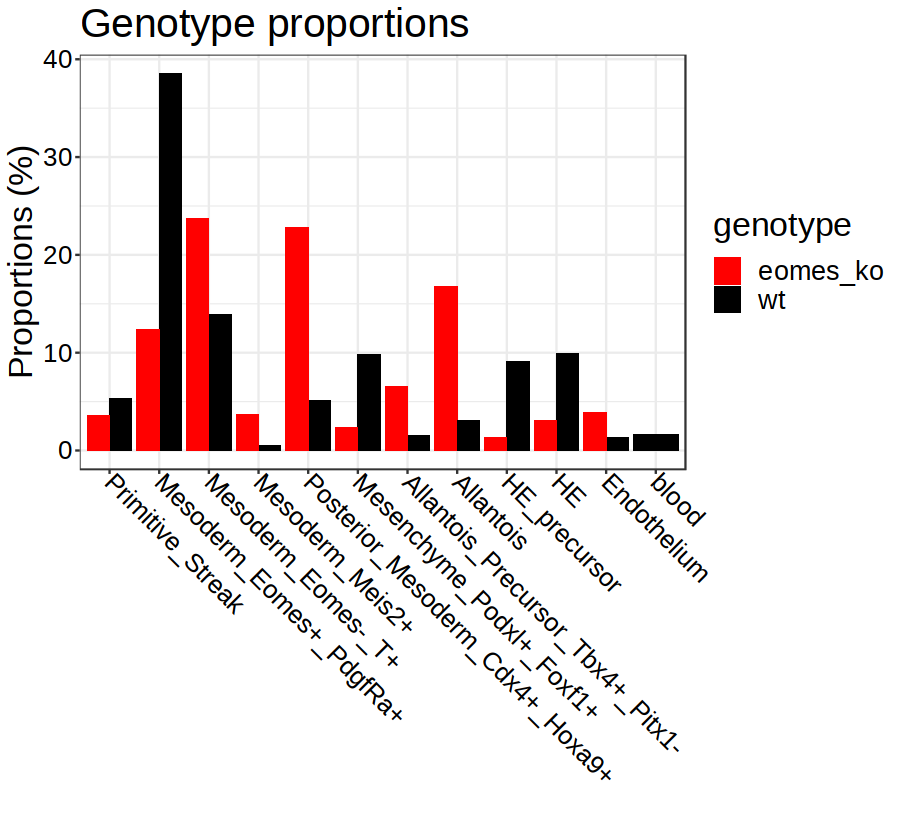

In [30]:
# Proportion per celltype
prop = meta %>%
    .[, Ntot := .N, by=c('genotype')] %>%
    .[, Ntest := .N, by=c('celltypes_v1', 'genotype')] %>% 
    .[, prop := Ntest/Ntot*100] %>% unique( by=c('celltypes_v1', 'genotype')) %>%
    .[,c('celltypes_v1', 'genotype', 'prop')] %>%
    .[, celltypes_v1 := factor(celltypes_v1, levels = unique(opts$clusters2celltypes))]

options(repr.plot.width=7.5, repr.plot.height=7)
ggplot(prop, aes(celltypes_v1, prop, fill=genotype)) + 
    geom_bar(stat='identity', position='dodge') +
    scale_fill_manual(values=c('wt' = 'black', 'eomes_ko' = 'red'), name='genotype') + 
    xlab('') + ylab('Proportions (%)') + 
    ggtitle('Genotype proportions') +
    theme_bw() + 
    theme(text = element_text(size=20),
          axis.text = element_text(color='black', size = 15),
          axis.text.x = element_text(angle=-45, hjust=0, vjust=0.5))

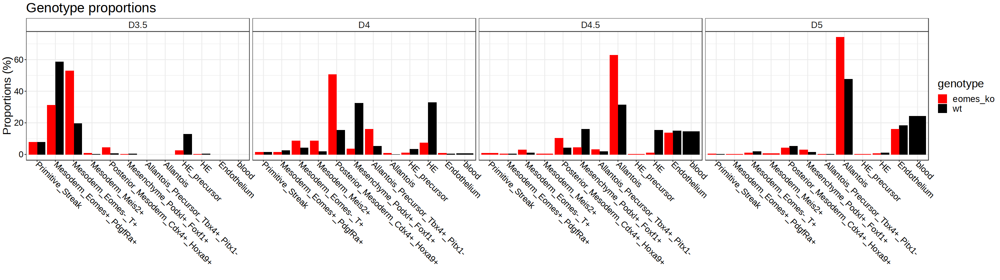

In [14]:
# Proportions per celltype & day
prop = meta %>%
    .[, Ntot := .N, by=c('day', 'genotype')] %>%
    .[, Ntest := .N, by=c('day', 'celltypes_v1', 'genotype')] %>% 
    .[, prop := Ntest/Ntot*100] %>% unique( by=c('day', 'celltypes_v1', 'genotype')) %>%
    .[,c('day', 'celltypes_v1', 'genotype', 'prop')] %>% 
    .[, celltypes_v1 := factor(celltypes_v1, levels = unique(opts$clusters2celltypes))]

options(repr.plot.width=25, repr.plot.height=7)
ggplot(prop, aes(celltypes_v1, prop, fill=genotype)) + 
    geom_bar(stat='identity', position='dodge') +
    scale_fill_manual(values=c('wt' = 'black', 'eomes_ko' = 'red'), name='genotype') + 
    xlab('') + ylab('Proportions (%)') + 
    ggtitle('Genotype proportions') +
    facet_wrap(~day, ncol=4) +
    theme_bw() + 
    theme(text = element_text(size=20),
          strip.background = element_rect(fill=NA),
          axis.text = element_text(color='black', size = 15),
          axis.text.x = element_text(angle=-45, hjust=0, vjust=0.5))

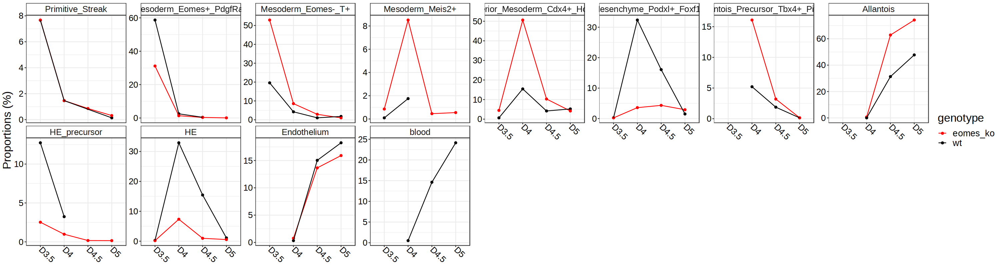

In [15]:
ggplot(prop, aes(day, prop, col=genotype, group=genotype)) + 
    geom_point() +
    geom_line() +
    scale_color_manual(values=c('wt' = 'black', 'eomes_ko' = 'red'), name='genotype') + 
    facet_wrap(~celltypes_v1, ncol=8, scales='free_y') +
    xlab('') + ylab('Proportions (%)') + 
    theme_bw() + 
    theme(text = element_text(size=20),
          strip.background = element_rect(fill=NA),
          strip.text = element_text(size=15),
          axis.text = element_text(color='black', size = 15),
          axis.text.x = element_text(angle=-45, hjust=0, vjust=0.5))

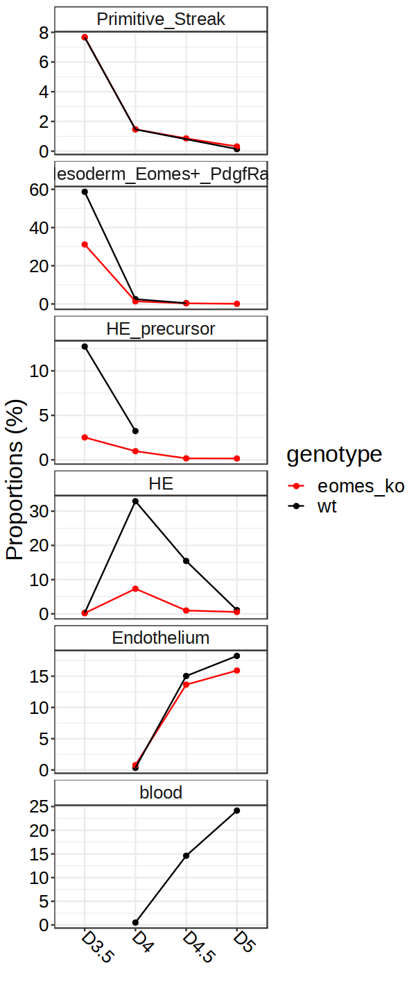

In [24]:
traj1 = c('Primitive_Streak', 'Mesoderm_Eomes+_PdgfRa+','HE_precursor','HE', 'blood', 'Endothelium')
options(repr.plot.width=5, repr.plot.height=12)
ggplot(prop[celltypes_v1 %in% traj1], aes(day, prop, col=genotype, group=genotype)) + 
    geom_point() +
    geom_line() +
    scale_color_manual(values=c('wt' = 'black', 'eomes_ko' = 'red'), name='genotype') + 
    facet_wrap(~celltypes_v1, ncol=1, scales='free_y') +
    xlab('') + ylab('Proportions (%)') + 
    theme_bw() + 
    theme(text = element_text(size=20),
          strip.background = element_rect(fill=NA),
          strip.text = element_text(size=15),
          axis.text = element_text(color='black', size = 15),
          axis.text.x = element_text(angle=-45, hjust=0, vjust=0.5))

In [25]:
unique(prop$celltypes_v1)

[1] Mesoderm_Eomes+_PdgfRa+          Mesoderm_Meis2+                 
 [3] Mesoderm_Eomes-_T+               Primitive_Streak                
 [5] Posterior_Mesoderm_Cdx4+_Hoxa9+  HE_precursor                    
 [7] HE                               Mesenchyme_Podxl+_Foxf1+        
 [9] Allantois_Precursor_Tbx4+_Pitx1- Endothelium                     
[11] blood                            Allantois                       
12 Levels: Primitive_Streak Mesoderm_Eomes+_PdgfRa+ ... blood

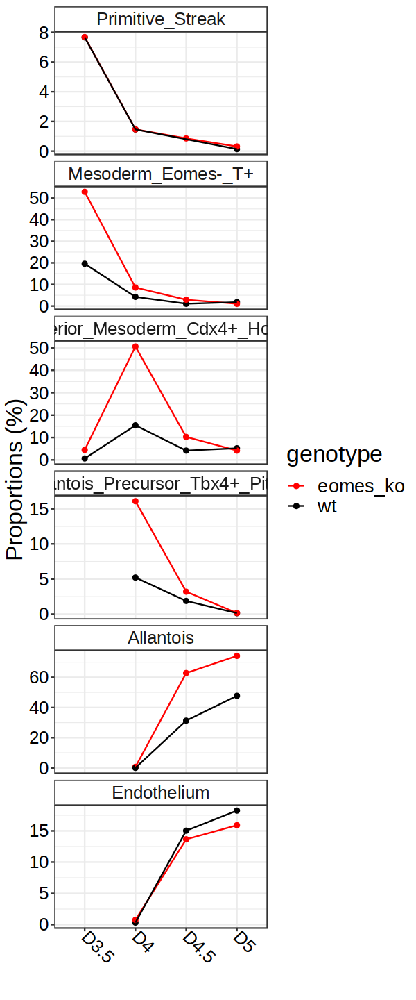

In [27]:
traj2 = c('Primitive_Streak', 'Mesoderm_Eomes-_T+','Posterior_Mesoderm_Cdx4+_Hoxa9+','Allantois_Precursor_Tbx4+_Pitx1-','Allantois', 'Endothelium')
options(repr.plot.width=5, repr.plot.height=12)
ggplot(prop[celltypes_v1 %in% traj2], aes(day, prop, col=genotype, group=genotype)) + 
    geom_point() +
    geom_line() +
    scale_color_manual(values=c('wt' = 'black', 'eomes_ko' = 'red'), name='genotype') + 
    facet_wrap(~celltypes_v1, ncol=1, scales='free_y') +
    xlab('') + ylab('Proportions (%)') + 
    theme_bw() + 
    theme(text = element_text(size=20),
          strip.background = element_rect(fill=NA),
          strip.text = element_text(size=15),
          axis.text = element_text(color='black', size = 15),
          axis.text.x = element_text(angle=-45, hjust=0, vjust=0.5))